In [3]:
# imports
import numpy as np
import joblib
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
import pandas as pd
from RISparser import readris
from scipy.sparse import vstack

print("import completed")

import completed


In [4]:
import sklearn

TrainingIncludes = readris(open('1_Training_Included_20878.ris.txt', 'r', encoding="utf-8"))
TrainingExcludes = readris(open('2_Training_Excluded_38635.ris.txt', 'r', encoding="utf-8"))
EvaluationIncludes = readris(open('5_Evaluation_Included_2310.ris.txt', 'r', encoding="utf-8"))
EvaluationExcludes = readris(open('6_Evaluation_Excluded_2412.ris.txt', 'r', encoding="utf-8"))
# read data into dataframes (this can take a few minutes)

def parseData(incl, excl, num):
    a=0
    data = pd.DataFrame(columns=['title', 'abstract', 'label'])
    for l in incl:
        if a < num:
            title = ''
            abstract = ''
            if 'abstract' in l:
                abstract = l['abstract']
            if 'primary_title' in l:
                title = l['primary_title']
            data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
            a +=1
        else:
            break
    a = 0
    for l in excl:
        if a < num:
            title = ''
            abstract = ''
            if 'abstract' in l:
                abstract = l['abstract']
            if 'primary_title' in l:
                title = l['primary_title']
            data = data.append({'title': title, 'abstract': abstract, 'label': 0}, ignore_index=True)
            a +=1
        else:
            break
    data.abstract = data.abstract.fillna('none')
    data.title = data.title.fillna('none')
    data = sklearn.utils.shuffle(data)
    data.reset_index(inplace=True)
    return data


TrainingDf = parseData(TrainingIncludes, TrainingExcludes, 20000)
EvaluationDf = parseData(EvaluationIncludes, EvaluationExcludes, 2000)
print("read completed")

/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:2

read completed


/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 0}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 0}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 0}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_88672/481656566.py:3

In [5]:
# build model
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer


def getFeatures(data):
    all_features = []
    for index in range(len(data)):
        title_tokens = data.title[index]
        abstract_tokens = data.abstract[index]
        features = ["t_%s" % t for t in title_tokens.split(" ") if not t in stopwords]
        features2 = ["a_%s" % t for t in abstract_tokens.split(" ") if not t in stopwords]
        features.extend(features2)
        all_features.append(" ".join(features))
    return all_features

stopwords = pd.read_csv('pubmed.stoplist.csv')

training_labels = TrainingDf.label.astype(int)
training_features = getFeatures(TrainingDf)
testing_labels = EvaluationDf.label.astype(int)
testing_features = getFeatures(EvaluationDf)

In [6]:
vec = TfidfVectorizer(ngram_range=(1,3), max_features=50000, min_df=3, strip_accents='unicode')
training_features = vec.fit_transform(training_features)
testing_features = vec.transform(testing_features)
print('前面都不会有问题，重制的话从这下面开始重新运行')

前面都不会有问题，重制的话从这下面开始重新运行


In [7]:
X_train = training_features
y_train = training_labels
print(X_train.shape, y_train.shape)

X_test = testing_features
y_test = testing_labels
print(X_test.shape, y_test.shape)

(40000, 50000) (40000,)
(4000, 50000) (4000,)


In [8]:
def get_initial_batches(X_train, y_train, initial_batch_size):
    X_train_label = X_train[0:initial_batch_size,]
    y_train_label = y_train[0:initial_batch_size,]
    X_train_unlabel = X_train[initial_batch_size:]
    y_train_unlabel = y_train[initial_batch_size:]
    
    return (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel)


def random_update(X_train_label, y_train_label, X_train_unlabel, y_train_unlabel, update_batch_size): # 不按照不确定性进行抽取，从U中直接开头抽取数据标记放入L中

    add_idxs = np.arange(update_batch_size)
    X_train_label = vstack([X_train_label,X_train_unlabel[add_idxs[:,]]])
    X_train_unlabel = X_train_unlabel[~np.in1d(np.arange(X_train_unlabel.shape[0]), add_idxs)]
    y_train_label = pd.concat([y_train_label, y_train_unlabel.iloc[add_idxs[:,]]])
    y_train_unlabel = y_train_unlabel[~np.in1d(np.arange(y_train_unlabel.shape[0]), add_idxs)]

    return (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel)


def uncertainty_update(X_train_label, y_train_label, X_train_unlabel, y_train_unlabel, update_batch_size, cls): # 通过不确定性进行抽取，从U中直接开头抽取数据标记放入L中

    unlabel_confidence_scores = cls.decision_function(X_train_unlabel)
    unlabel_confidence_scores = np.absolute(unlabel_confidence_scores)  # cls.decision_function求出unlabel instance的confidence score并绝对值
    uncertain_idxs = np.argsort(unlabel_confidence_scores)[0:update_batch_size] # low to high 按照confidence得分从小到大排列，提取出batchsize个instance的index 0321 2 「0，3」
    X_train_label = vstack([X_train_label,X_train_unlabel[uncertain_idxs[:,]]])
    X_train_unlabel = X_train_unlabel[~np.in1d(np.arange(X_train_unlabel.shape[0]), uncertain_idxs)]
    y_train_label = pd.concat([y_train_label, y_train_unlabel.iloc[uncertain_idxs[:,]]])
    y_train_unlabel = y_train_unlabel[~np.in1d(np.arange(y_train_unlabel.shape[0]), uncertain_idxs)]
    
    return (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel)


def cross_val(X_train_label, y_train_label): #评估模型在训练集上的表现
    n_folds = 20
    cls = LogisticRegression(random_state=0, max_iter = 1000)
    cross_val = cross_validate(cls, X_train_label, y_train_label, 
                               cv=n_folds, scoring = 'f1',
                               return_train_score = True) #dict results
    test_f1 = np.mean(cross_val['test_score'])
    train_f1 = np.mean(cross_val['train_score'])
    return (test_f1, train_f1)

def fit_cls(X_train_label, y_train_label):
    cls = LogisticRegression(random_state=0, max_iter = 1000).fit(X_train_label, y_train_label)
    return cls


def eval_batch_f1(X_test, y_test, cls): #评估模型在测试集上的表现
    y_pred = cls.predict(X_test)
    f1 = f1_score(y_test, y_pred)
    return f1


# def eval_batch_uncertainty(X_eval,cls):
#
#     confidence_score = cls.decision_function(X_eval)
#     confidence_score = np.absolute(confidence_score)
#     confidence_score = np.mean(confidence_score)
#
#     return confidence_score
#
#
# def eval_batch_derivative(batch_sizes, eval_f_scores):
#
#     x1,y1 = batch_sizes[-2], eval_f_scores[-2]
#     x2,y2 = batch_sizes[-1], eval_f_scores[-1]
#     slope = (y2 - y1)/(x2 - x1)
#
#     return slope

In [9]:
# fn to run active learning on lr classifier 
def al_slope_all_data(X_train,y_train,X_test,y_test,initial_batch_size,update_batch_size, 
                   al_type = "uncertainty"):
    
    test_f_scores = []
    train_f_scores = []
    test_set_fs = [] #true test
    train_set_fs = [] # labelled data so far
    batch_sizes = []
    
    # get initial batch
    (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel) = get_initial_batches(X_train, 
                                                                                           y_train, 
                                                                                           initial_batch_size)
    
     # eval_batch                                                                                        
    # print(y_train_label)
    cls = fit_cls(X_train_label, y_train_label) # 训练分类器
    (test_f1,train_f1) = cross_val(X_train_label, y_train_label)
    test_f_scores.append(test_f1)
    train_f_scores.append(train_f1)
    batch_sizes.append(initial_batch_size)
    test_set_f = eval_batch_f1(X_test, y_test, cls)
    test_set_fs.append(test_set_f)
    train_set_f = eval_batch_f1(X_train_label, y_train_label, cls)
    train_set_fs.append(train_set_f)
    
    
    while X_train_unlabel.shape[0] > 0:
        
        # update batch
        if al_type == "uncertainty":
            (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel) = uncertainty_update(X_train_label, 
                                                                                             y_train_label, 
                                                                                             X_train_unlabel, 
                                                                                             y_train_unlabel, 
                                                                                             update_batch_size, 
                                                                                             cls)
            
        # update batch
        elif al_type == "random":
            (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel) = random_update(X_train_label, 
                                                                                             y_train_label, 
                                                                                             X_train_unlabel, 
                                                                                             y_train_unlabel, 
                                                                                             update_batch_size)
       
        # eval_batch                                                                                    
        cls = fit_cls(X_train_label, y_train_label)
        (test_f1,train_f1) = cross_val(X_train_label, y_train_label)
        test_f_scores.append(test_f1)
        train_f_scores.append(train_f1)
        batch_sizes.append(X_train_label.shape[0])
        test_set_f = eval_batch_f1(X_test, y_test, cls)
        test_set_fs.append(test_set_f)
        train_set_f = eval_batch_f1(X_train_label, y_train_label, cls)
        train_set_fs.append(train_set_f)
        
    return (batch_sizes, test_f_scores, train_f_scores, test_set_fs,train_set_fs)

(r_batch_sizes, r_test_f_scores, r_train_f_scores, r_test_set_fs, r_train_set_fs) = al_slope_all_data(X_train, y_train, X_test,y_test, 1000,1000, "random")
(u_batch_sizes, u_test_f_scores, u_train_f_scores, u_test_set_fs, u_train_set_fs) = al_slope_all_data(X_train, y_train, X_test,y_test, 1000,1000, "uncertainty")
print("开始画图")

开始画图


In [10]:
cls = LogisticRegression(random_state=0, max_iter = 1000).fit(X_train, y_train)
f1_onalltrainingdata = round(f1_score(y_test, cls.predict(X_test)),3)
print("F1 on test with all training data:",  f1_onalltrainingdata)

F1 on test with all training data: 0.878


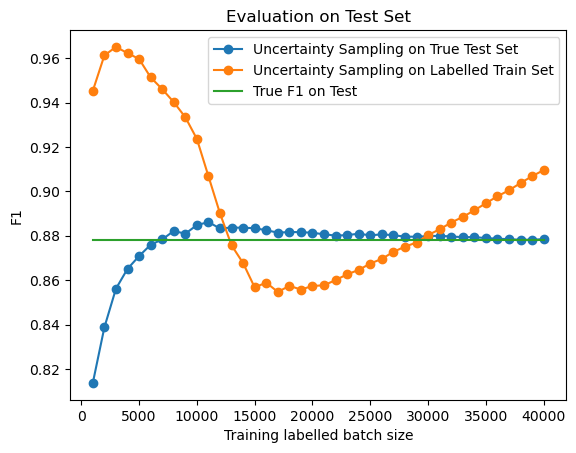

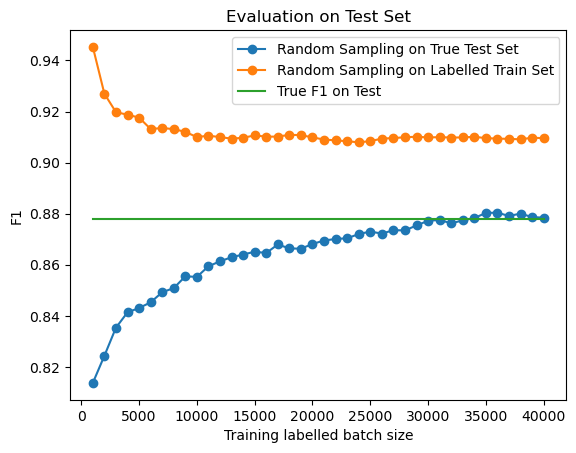

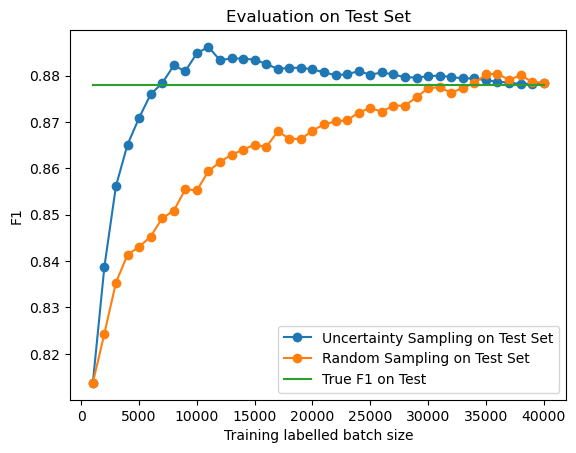

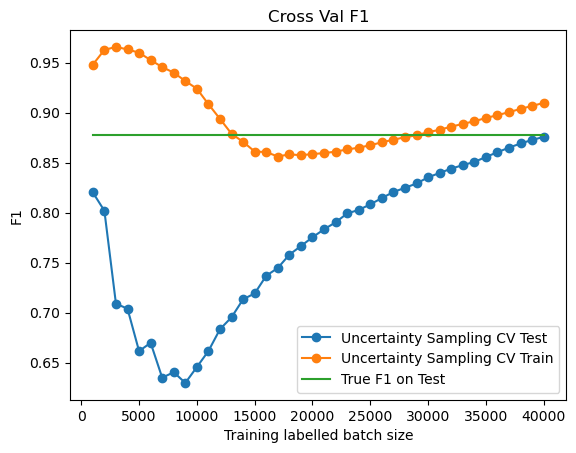

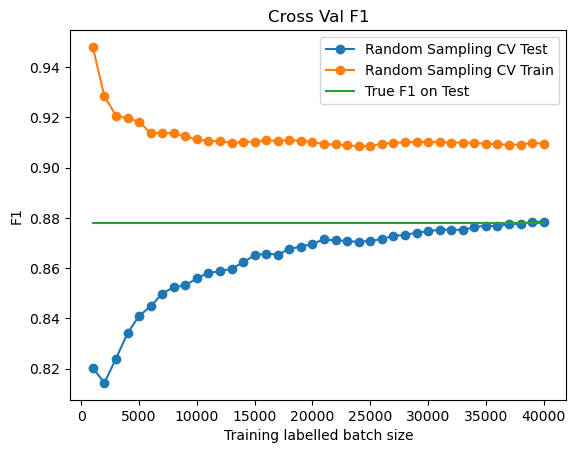

In [11]:
plt.plot(u_batch_sizes, u_test_set_fs, '-o', label = "Uncertainty Sampling on True Test Set")
#plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(r_batch_sizes, u_train_set_fs, '-o', label = "Uncertainty Sampling on Labelled Train Set")
plt.plot(u_batch_sizes, [f1_onalltrainingdata for i in u_batch_sizes], label = "True F1 on Test") # 这0.85应该是整个训练集全跑的f1score
#plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Evaluation on Test Set")
plt.legend()
plt.show()


plt.plot(u_batch_sizes, r_test_set_fs, '-o', label = "Random Sampling on True Test Set")
#plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(r_batch_sizes, r_train_set_fs, '-o', label = "Random Sampling on Labelled Train Set")
plt.plot(u_batch_sizes, [f1_onalltrainingdata for i in u_batch_sizes], label = "True F1 on Test")
#plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Evaluation on Test Set")
plt.legend()
plt.show()


plt.plot(u_batch_sizes, u_test_set_fs, '-o', label = "Uncertainty Sampling on Test Set")
#plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(r_batch_sizes, r_test_set_fs, '-o', label = "Random Sampling on Test Set")
plt.plot(u_batch_sizes, [f1_onalltrainingdata for i in u_batch_sizes], label = "True F1 on Test")
#plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Evaluation on Test Set")
plt.legend()
plt.show()


plt.plot(u_batch_sizes, u_test_f_scores, '-o', label = "Uncertainty Sampling CV Test")
#plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(u_batch_sizes, u_train_f_scores, '-o', label = "Uncertainty Sampling CV Train")
plt.plot(u_batch_sizes, [f1_onalltrainingdata for i in u_batch_sizes], label = "True F1 on Test")
#plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Cross Val F1")
plt.legend()
plt.show()

#plt.plot(u_batch_sizes, u_test_f_scores, '-o', label = "Uncertainty Sampling Test")
plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling CV Test")
#plt.plot(u_batch_sizes, u_train_f_scores, '-o', label = "Uncertainty Sampling Train")
plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling CV Train")
plt.plot(u_batch_sizes, [f1_onalltrainingdata for i in u_batch_sizes], label = "True F1 on Test")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Cross Val F1")
plt.legend()
plt.show()